## Analysising collision data from The Plain

Data source: https://bikedata.cyclestreets.net

In [100]:
import datetime
import json
import pathlib
import collections

import astral
import astral.sun
import geopandas
import geopy.distance
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import pytz
from astral.sun import sun
from matplotlib import cm

In [6]:
data_path = pathlib.Path.cwd().parent.joinpath("data/collisions_the_plain.csv")

In [7]:
df = pd.read_csv(data_path)
df["Timestamp"] = pd.to_datetime(df["Timestamp"])
# Set timezone
tz = pytz.timezone("Europe/London")
df["Timestamp"] = df.apply(lambda x: tz.localize(x["Timestamp"], is_dst=True), axis=1)

In [8]:
df.head()

,Accident Index,Timestamp,severity,Casualties,Number of Casualties,Number of Vehicles,url,apiUrl,Latitude,Longitude
0,2019430024462,2019-01-22 06:15:00+00:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749909,-1.244002
1,2019430142429,2019-05-08 13:00:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.750333,-1.244328
2,2019430171180,2019-06-05 06:40:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749909,-1.244002
3,2019430196548,2019-06-28 11:00:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749928,-1.244147
4,2019430287225,2019-08-17 22:45:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749918,-1.244017


In [9]:
df["Timestamp"].dt.time

0      06:15:00
1      13:00:00
2      06:40:00
3      11:00:00
4      22:45:00
         ...   
201    07:30:00
202    16:30:00
203    07:15:00
204    19:13:00
205    19:20:00
Name: Timestamp, Length: 206, dtype: object

## Location of The Plain

From Open Street Map: https://www.openstreetmap.org/search?whereami=1&query=51.75012%2C-1.24414#map=19/51.75012/-1.24414
From Google Maps: https://www.google.com/maps/place/51%C2%B045'00.3%22N+1%C2%B014'38.7%22W/@51.750094,-1.2446402,19z/data=!3m1!4b1!4m6!3m5!1s0x0:0xd90a8e7755b1d0de!7e2!8m2!3d51.7500937!4d-1.2440932

From https://www.mapdevelopers.com/draw-circle-tool.php I think a radius of 40m around the centre of the roundabout is "the junction" for our purposes, see [here](https://www.mapdevelopers.com/draw-circle-tool.php?circles=%5B%5B41.27%2C51.7500857%2C-1.2440797%2C%22%23AAAAAA%22%2C%22%23000000%22%2C0.4%5D%2C%5B40%2C51.7191343%2C-1.2446295%2C%22%23AAAAAA%22%2C%22%23000000%22%2C0.4%5D%5D). Will potentially update this if e.g. there are a cluster of clearly The Plain related crashes we're missing. 

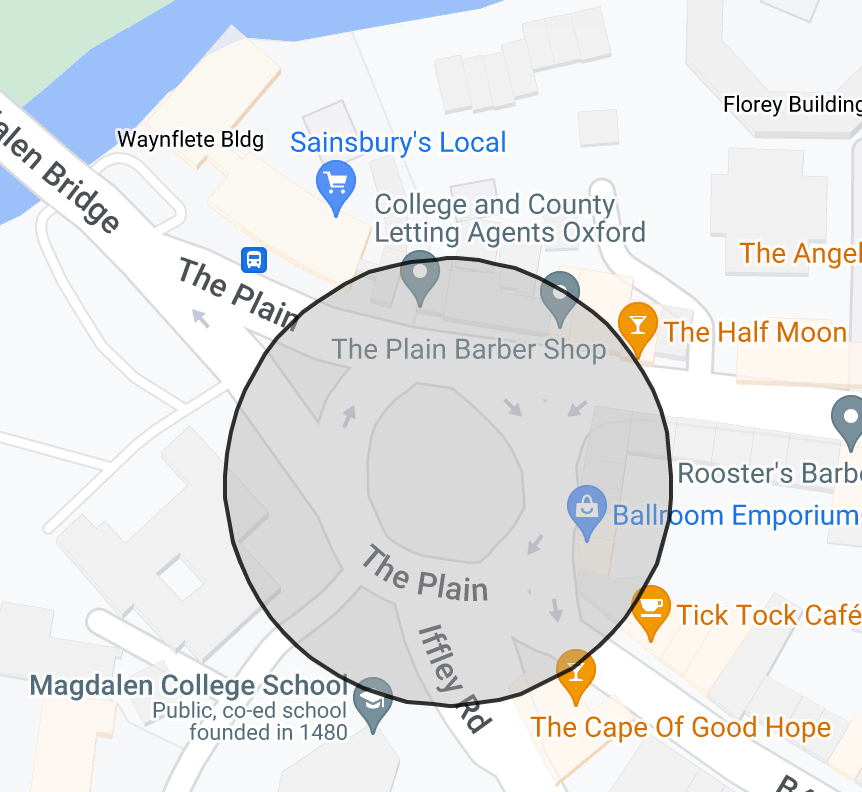

In [10]:
def inside_plain(latitude: float, longitude: float, radius_metres: float = 25) -> bool:
    """Whether a coordinate is inside our boundary for The Plain roundabout"""
    plain_latitude = 51.75012
    plain_longitude = -1.24414
    return (
        geopy.distance.geodesic(
            (plain_latitude, plain_longitude), (latitude, longitude)
        ).m
        < radius_metres
    )


inside_plain(51.749909, -1.244002)

False

In [11]:
df["inside_plain"] = df.apply(
    lambda x: inside_plain(x["Latitude"], x["Longitude"]), axis=1
)

In [12]:
df

,Accident Index,Timestamp,severity,Casualties,Number of Casualties,Number of Vehicles,url,apiUrl,Latitude,Longitude,inside_plain
0,2019430024462,2019-01-22 06:15:00+00:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749909,-1.244002,False
1,2019430142429,2019-05-08 13:00:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.750333,-1.244328,False
2,2019430171180,2019-06-05 06:40:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749909,-1.244002,False
3,2019430196548,2019-06-28 11:00:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749928,-1.244147,True
4,2019430287225,2019-08-17 22:45:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749918,-1.244017,True
...,...,...,...,...,...,...,...,...,...,...,...
201,200043P370080,2000-08-24 07:30:00+01:00,slight,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749858,-1.244238,False
202,199943P022129,1999-12-03 16:30:00+00:00,slight,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.750124,-1.243655,False
203,199943P137029,1999-02-15 07:15:00+00:00,slight,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749767,-1.243950,False
204,199943P200029,1999-02-17 19:13:00+00:00,slight,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749856,-1.243949,False


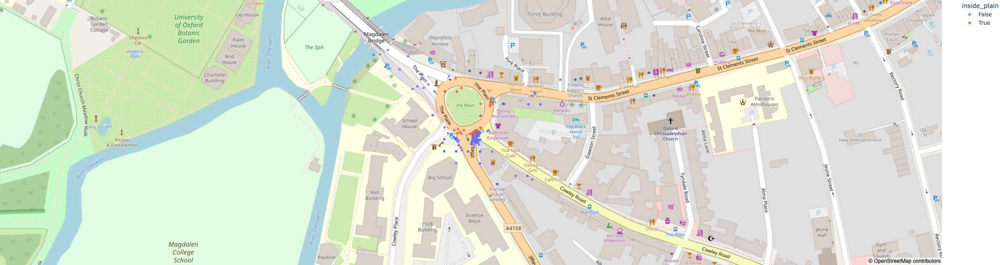

In [13]:
def plot_plain(df):
    fig = px.scatter_mapbox(
        df.fillna(0),
        lat="Latitude",
        lon="Longitude",
        color="inside_plain",
        color_continuous_scale="Viridis",
        opacity=0.8,
        zoom=17,
        height=600,
        width=1000,
    )
    fig.update_layout(mapbox_style="open-street-map")
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
    fig.show()


plot_plain(df)

OK 25 metre diameter isn't quite right so let's push it out to 30m

In [14]:
df["inside_plain"] = df.apply(
    lambda x: inside_plain(x["Latitude"], x["Longitude"], radius_metres=30), axis=1
)

In [15]:
df.head()

,Accident Index,Timestamp,severity,Casualties,Number of Casualties,Number of Vehicles,url,apiUrl,Latitude,Longitude,inside_plain
0,2019430024462,2019-01-22 06:15:00+00:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749909,-1.244002,True
1,2019430142429,2019-05-08 13:00:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.750333,-1.244328,True
2,2019430171180,2019-06-05 06:40:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749909,-1.244002,True
3,2019430196548,2019-06-28 11:00:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749928,-1.244147,True
4,2019430287225,2019-08-17 22:45:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749918,-1.244017,True


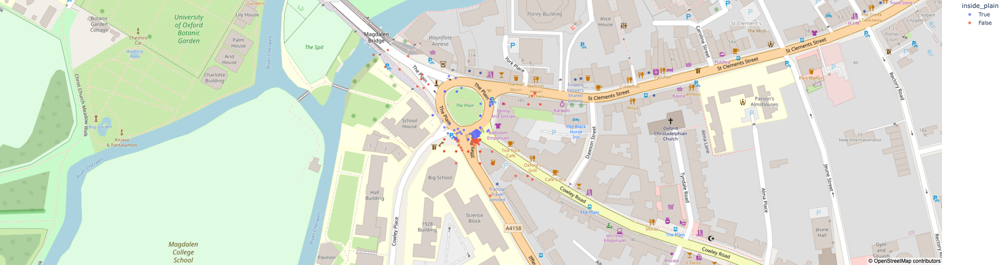

In [16]:
plot_plain(df)

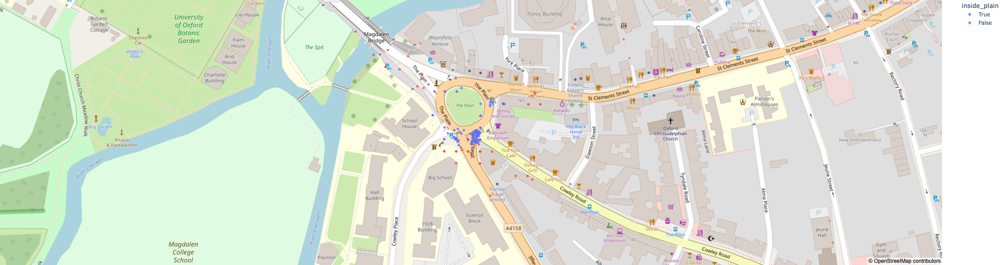

In [17]:
# Still not quite big enough, want to pick up that cluster at the Cowley Road junction
df["inside_plain"] = df.apply(
    lambda x: inside_plain(x["Latitude"], x["Longitude"], radius_metres=35), axis=1
)
plot_plain(df)

OK 35m looks good enough

## Time of day of collisions

In [18]:
df["time_of_day"] = df["Timestamp"].dt.time

In [19]:
def time_to_theta(time: datetime.time) -> float:
    return (2 * np.pi / (24 * 60 * 60)) * (
        time.hour * 3600 + time.minute * 60 + time.second
    )

In [20]:
df["theta"] = (2 * np.pi / (24 * 60 * 60)) * (
    df["Timestamp"].dt.hour * 3600
    + df["Timestamp"].dt.minute * 60
    + df["Timestamp"].dt.second
)

In [21]:
n_bins = 24 * 2
time_bins = np.linspace(0, 2 * np.pi, n_bins, endpoint=False)
labels = range(n_bins - 1)
df["time_bin"] = pd.cut(df["theta"], bins=time_bins, labels=labels)
df["time_bin_theta"] = df["time_bin"].apply(lambda x: x * 2 * np.pi / n_bins)

/var/folders/fg/w06k0nvx1w513ss83703ycf00000gn/T/ipykernel_14944/459188210.py:16: UserWarning:

FixedFormatter should only be used together with FixedLocator



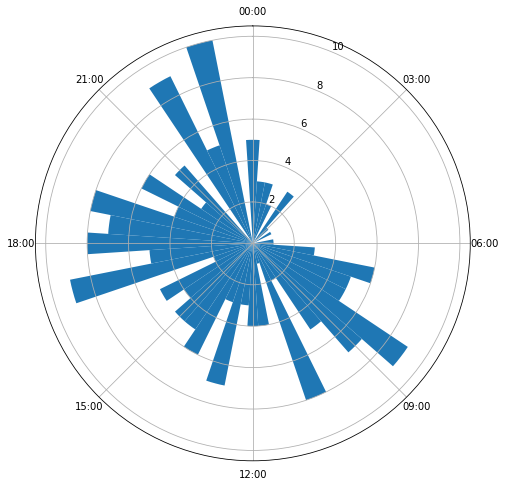

In [22]:
plt.figure(figsize=(8, 8))

width = (2 * np.pi) / n_bins
bottom = 0

ax = plt.subplot(111, polar=True)
bars = ax.bar(
    df["time_bin_theta"].value_counts().index,
    df["time_bin_theta"].value_counts().values,
    width=width,
    bottom=bottom,
)

ax.set_theta_zero_location("N")  # theta=0 at the top
ax.set_theta_direction(-1)  # theta increasing clockwise
ax.set_xticklabels(
    ["00:00", "03:00", "06:00", "09:00", "12:00", "15:00", "18:00", "21:00"]
)

plt.savefig("plain_time_of_day.png", bbox_inches="tight")
plt.show()

### Plot for cyclists only

In [23]:
df["Casualties"].value_counts()

Cyclist       193
Pedestrian     13
Name: Casualties, dtype: int64

In [24]:
df_cyclists = df.loc[df["Casualties"] == "Cyclist"]

/var/folders/fg/w06k0nvx1w513ss83703ycf00000gn/T/ipykernel_14944/1058536703.py:17: UserWarning:

FixedFormatter should only be used together with FixedLocator



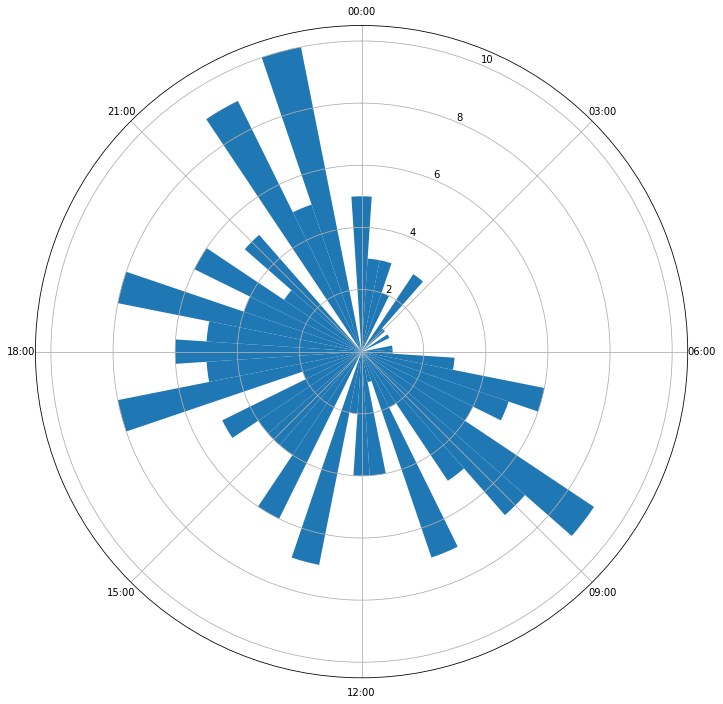

In [25]:
# Cyclists only (not much difference)
plt.figure(figsize=(12, 12))

width = (2 * np.pi) / n_bins
bottom = 0

ax = plt.subplot(111, polar=True)
bars = ax.bar(
    df_cyclists["time_bin_theta"].value_counts().index,
    df_cyclists["time_bin_theta"].value_counts().values,
    width=width,
    bottom=bottom,
)

ax.set_theta_zero_location("N")  # theta=0 at the top
ax.set_theta_direction(-1)  # theta increasing clockwise
ax.set_xticklabels(
    ["00:00", "03:00", "06:00", "09:00", "12:00", "15:00", "18:00", "21:00"]
)

plt.savefig("plain_time_of_day.png", bbox_inches="tight")
plt.show()

### Plot with dots per collision, coloured by severity

In [26]:
# Make the severity column a categorical one so we can sort by it
df_cyclists["severity"] = pd.Categorical(
    df_cyclists["severity"],
    categories=["slight", "serious"],
    ordered=True,
)

/var/folders/fg/w06k0nvx1w513ss83703ycf00000gn/T/ipykernel_14944/163995350.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [27]:
df_cyclists["time_bin_cumcount"] = df_cyclists.groupby("time_bin_theta").cumcount() + 1

/var/folders/fg/w06k0nvx1w513ss83703ycf00000gn/T/ipykernel_14944/4070449758.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [28]:
df_cyclists.head()

,Accident Index,Timestamp,severity,Casualties,Number of Casualties,Number of Vehicles,url,apiUrl,Latitude,Longitude,inside_plain,time_of_day,theta,time_bin,time_bin_theta,time_bin_cumcount
0,2019430024462,2019-01-22 06:15:00+00:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749909,-1.244002,True,06:15:00,1.636246,12,1.570796,1
1,2019430142429,2019-05-08 13:00:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.750333,-1.244328,True,13:00:00,3.403392,26,3.403392,1
2,2019430171180,2019-06-05 06:40:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749909,-1.244002,True,06:40:00,1.745329,13,1.701696,1
3,2019430196548,2019-06-28 11:00:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749928,-1.244147,True,11:00:00,2.879793,21,2.748894,1
4,2019430287225,2019-08-17 22:45:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749918,-1.244017,True,22:45:00,5.955936,45,5.890486,1


In [29]:
for severity in df_cyclists["severity"].unique():
    print(severity)

serious
slight


/var/folders/fg/w06k0nvx1w513ss83703ycf00000gn/T/ipykernel_14944/2784611427.py:19: UserWarning:

FixedFormatter should only be used together with FixedLocator



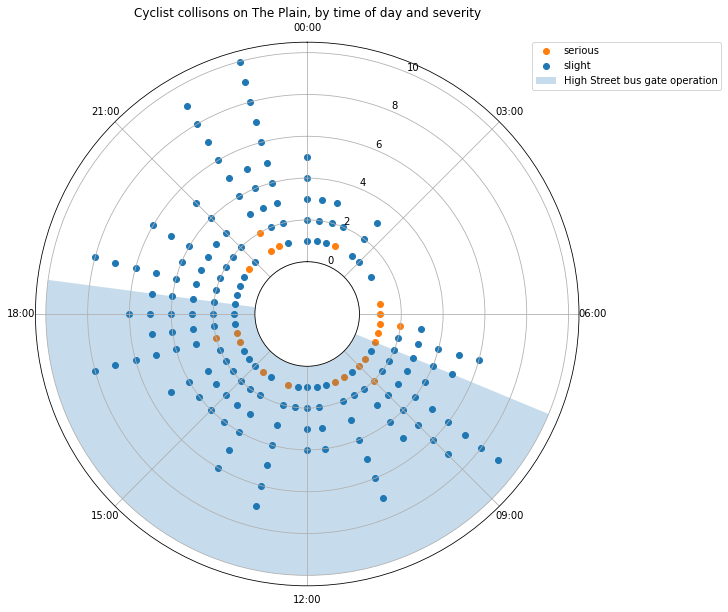

In [30]:
colours = {"serious": "C1", "slight": "C0"}

fig = plt.figure(figsize=(10, 10))
fig.patch.set_alpha(1.0)  # no partially transparent plots
ax = fig.add_subplot(projection="polar")

for severity in df_cyclists["severity"].unique():  # may need some though for sorting
    ax.scatter(
        df_cyclists.loc[df_cyclists["severity"] == severity]["time_bin_theta"],
        df_cyclists.loc[df_cyclists["severity"] == severity]["time_bin_cumcount"],
        c=colours[severity],
        label=severity,
    )

origin_offset = 2.5
ax.set_rorigin(-origin_offset)
ax.set_theta_zero_location("N")  # theta=0 at the top
ax.set_theta_direction(-1)  # theta increasing clockwise
ax.set_xticklabels(
    ["00:00", "03:00", "06:00", "09:00", "12:00", "15:00", "18:00", "21:00"]
)

# Show high street bus gate operational time (07:30 to 18:30)
ax.fill_between(
    np.linspace(
        time_to_theta(datetime.time(hour=7, minute=30)),
        time_to_theta(datetime.time(hour=18, minute=30)),
        100,
    ),
    0,
    df_cyclists["time_bin_cumcount"].max(),  # fill to maximum extent
    alpha=0.25,
    label="High Street bus gate operation",
)

ax.legend(
    loc="lower left",
    bbox_to_anchor=(0.55 + np.cos(np.pi / 4) / 2, 0.55 + np.sin(np.pi / 4) / 2),
)
ax.set_title("Cyclist collisons on The Plain, by time of day and severity")
plt.savefig("plain_time_of_day_severity.png", bbox_inches="tight", dpi=300)
plt.show()

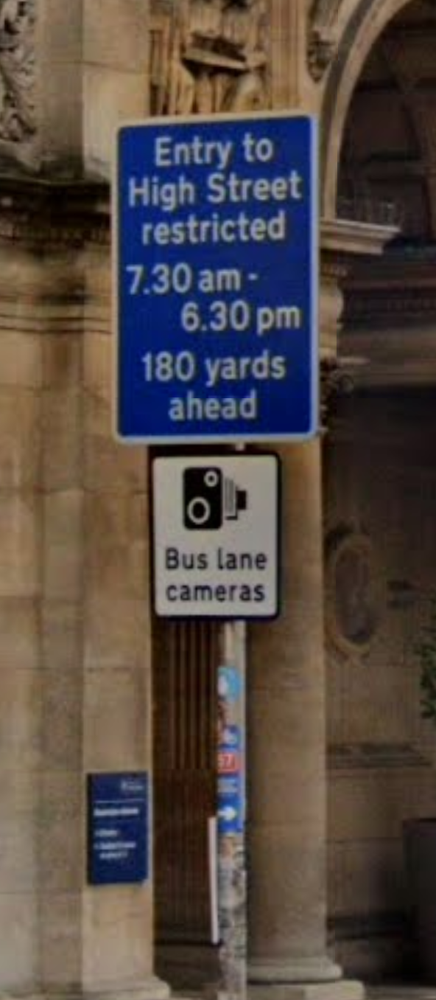

## Bits for Twitter

In [31]:
df_cyclists["Timestamp"].dt.date.max()

datetime.date(2020, 11, 3)

In [32]:
df_cyclists["Timestamp"].dt.date.min()

datetime.date(1999, 2, 15)

In [33]:
len(df_cyclists)

193

## Day or nighttime

In [41]:
def is_light(dt) -> bool:
    """Whether a particular datetime is between sunrise and sunset"""
    oxford = astral.LocationInfo("Oxford", "England", "Europe/London", 51.75, -1.24)
    s = sun(oxford.observer, date=dt.date())
    return s["sunrise"] < dt and dt < s["sunset"]

In [42]:
def time_of_day_type(dt) -> str:
    """Whether a particular datetime is at night, dawn, daytime or dusk"""
    oxford = astral.LocationInfo("Oxford", "England", "Europe/London", 51.75, -1.24)
    s = sun(oxford.observer, date=dt.date())
    if s["sunrise"] < dt and dt <= s["sunset"]:
        return "daytime"
    elif s["dawn"] < dt and dt <= s["sunrise"]:
        return "dawn"
    elif s["sunset"] < dt and dt <= s["dusk"]:
        return "dusk"
    return "nighttime"

In [43]:
is_light(df_cyclists["Timestamp"][0])

False

In [44]:
time_of_day_type(df_cyclists["Timestamp"][0])

'nighttime'

In [45]:
df_cyclists["is_daytime"] = df.apply(lambda x: is_light(x["Timestamp"]), axis=1)
df_cyclists["time_of_day_type"] = df.apply(
    lambda x: time_of_day_type(x["Timestamp"]), axis=1
)

/var/folders/fg/w06k0nvx1w513ss83703ycf00000gn/T/ipykernel_14944/1697048487.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/fg/w06k0nvx1w513ss83703ycf00000gn/T/ipykernel_14944/1697048487.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [66]:
df_cyclists.sort_values("is_daytime", ascending=True)

,Accident Index,Timestamp,severity,Casualties,Number of Casualties,Number of Vehicles,url,apiUrl,Latitude,Longitude,inside_plain,time_of_day,theta,time_bin,time_bin_theta,time_bin_cumcount,is_daytime,time_of_day_type
0,2019430024462,2019-01-22 06:15:00+00:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749909,-1.244002,True,06:15:00,1.636246,12,1.570796,1,False,nighttime
118,201143P008111,2011-11-02 17:05:00+00:00,slight,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.750036,-1.243946,True,17:05:00,4.472406,34,4.450590,5,False,dusk
117,201243P334122,2012-12-08 18:18:00+00:00,slight,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749857,-1.244094,True,18:18:00,4.790929,36,4.712389,3,False,nighttime
114,201243P160032,2012-03-17 00:37:00+00:00,slight,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749767,-1.244095,False,00:37:00,0.161443,1,0.130900,2,False,nighttime
111,201243P083042,2012-04-01 21:30:00+01:00,slight,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749857,-1.244094,True,21:30:00,5.628687,42,5.497787,3,False,nighttime
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107,201343P265033,2013-03-31 15:54:00+01:00,slight,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749857,-1.243964,True,15:54:00,4.162610,31,4.057891,1,True,daytime
106,201343P246083,2013-08-27 19:03:00+01:00,slight,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749556,-1.243317,False,19:03:00,4.987278,38,4.974188,2,True,daytime
105,201343P205033,2013-03-22 16:10:00+00:00,slight,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.749859,-1.244253,True,16:10:00,4.232423,32,4.188790,2,True,daytime
24,199943P418069,1999-06-28 14:43:00+01:00,serious,Cyclist,1,2,https://www.cyclestreets.net/collisions/report...,https://api.cyclestreets.net/v2/collisions.loc...,51.750036,-1.243946,True,14:43:00,3.852814,29,3.796091,1,True,daytime


/var/folders/fg/w06k0nvx1w513ss83703ycf00000gn/T/ipykernel_14944/1980660185.py:22: UserWarning:

FixedFormatter should only be used together with FixedLocator



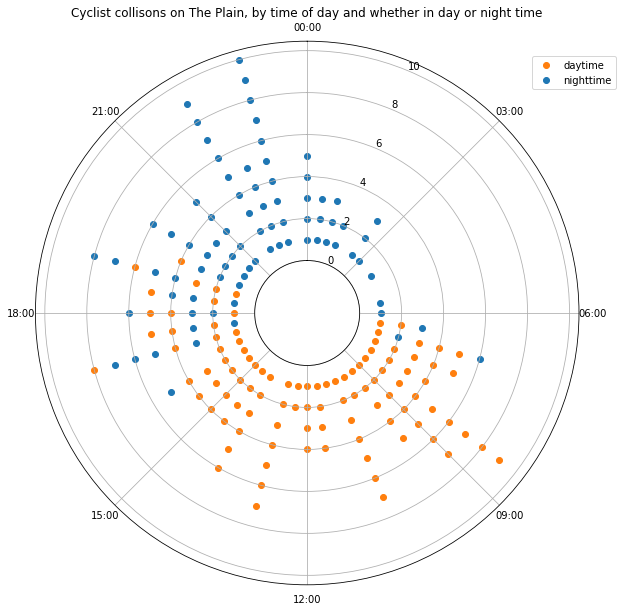

In [47]:
colours = {True: "C1", False: "C0"}
labels = {True: "daytime", False: "nighttime"}

df_graph = df_cyclists.sort_values("is_daytime", ascending=False)

fig = plt.figure(figsize=(10, 10))
fig.patch.set_alpha(1.0)  # no partially transparent plots
ax = fig.add_subplot(projection="polar")

for is_dt in df_graph["is_daytime"].unique():  # may need some though for sorting
    ax.scatter(
        df_graph.loc[df_graph["is_daytime"] == is_dt]["time_bin_theta"],
        df_graph.loc[df_graph["is_daytime"] == is_dt]["time_bin_cumcount"],
        c=colours[is_dt],
        label=labels[is_dt],
    )

origin_offset = 2.5
ax.set_rorigin(-origin_offset)
ax.set_theta_zero_location("N")  # theta=0 at the top
ax.set_theta_direction(-1)  # theta increasing clockwise
ax.set_xticklabels(
    ["00:00", "03:00", "06:00", "09:00", "12:00", "15:00", "18:00", "21:00"]
)

# # Show high street bus gate operational time (07:30 to 18:30)
# ax.fill_between(
#     np.linspace(
#         time_to_theta(datetime.time(hour=7, minute=30)),
#         time_to_theta(datetime.time(hour=18, minute=30)),
#         100,
#     ),
#     0,
#     df_cyclists["time_bin_cumcount"].max(),  # fill to maximum extent
#     alpha=0.25,
#     label="High Street bus gate operation",
# )

ax.legend(
    loc="lower left",
    bbox_to_anchor=(0.55 + np.cos(np.pi / 4) / 2, 0.55 + np.sin(np.pi / 4) / 2),
)
ax.set_title(
    "Cyclist collisons on The Plain, by time of day and whether in day or night time"
)
plt.savefig("plain_time_of_day_daytime_or_nighttime.png", bbox_inches="tight", dpi=300)
plt.show()

In [48]:
df_cyclists["is_daytime"].value_counts()

True     104
False     89
Name: is_daytime, dtype: int64

In [51]:
df_cyclists["time_of_day_type"].value_counts()

daytime      104
nighttime     82
dusk           5
dawn           2
Name: time_of_day_type, dtype: int64

In [52]:
def survey(results, category_names):
    """
    Parameters
    ----------
    results : dict
        A mapping from question labels to a list of answers per category.
        It is assumed all lists contain the same number of entries and that
        it matches the length of *category_names*.
    category_names : list of str
        The category labels.
    """
    labels = list(results.keys())
    data = np.array(list(results.values()))
    data_cum = data.cumsum(axis=1)
    category_colors = plt.get_cmap()(np.linspace(0.15, 0.85, data.shape[1]))

    fig, ax = plt.subplots(figsize=(9.2, 5))
    ax.invert_yaxis()
    ax.xaxis.set_visible(False)
    ax.set_xlim(0, np.sum(data, axis=1).max())

    for i, (colname, color) in enumerate(zip(category_names, category_colors)):
        widths = data[:, i]
        starts = data_cum[:, i] - widths
        rects = ax.barh(
            labels, widths, left=starts, height=0.5, label=colname, color=color
        )

        r, g, b, _ = color
        text_color = "white" if r * g * b < 0.5 else "darkgrey"
        ax.bar_label(rects, label_type="center", color=text_color, fmt="%.0f%%")

    ax.legend(
        ncol=len(category_names),
        bbox_to_anchor=(0, -0.1),
        loc="lower left",
        fontsize="small",
    )

    return fig, ax

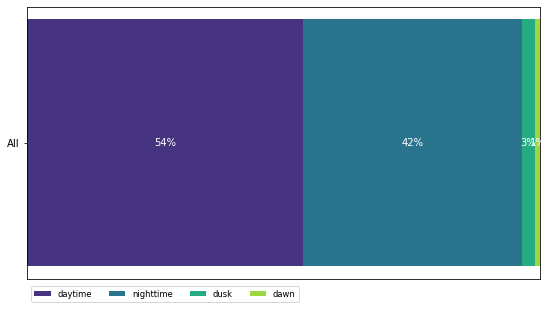

In [59]:
time_of_day = {"All": df_cyclists["time_of_day_type"].value_counts(normalize=True).tolist()}

time_of_day = {k: list(map(lambda x: x * 100, v)) for k, v in time_of_day.items()}
time_of_day_category_names = df_cyclists["time_of_day_type"].value_counts().index.tolist()
survey(time_of_day, time_of_day_category_names)
plt.show()

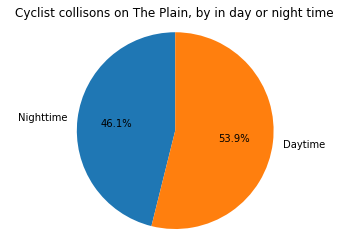

In [88]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = ['Daytime', 'Nighttime']
sizes = df_cyclists["is_daytime"].value_counts().tolist()
labels.reverse()
sizes.reverse()  # To get better colour scheme (!)

fig1, ax = plt.subplots()
ax.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax.set_title(
    "Cyclist collisons on The Plain, by in day or night time"
)
plt.show()

## Timeseries

In [105]:
year_counter = collections.Counter(df_cyclists.apply(
    lambda x: x["Timestamp"].year, axis=1
).values)
year_counter.keys()

dict_keys([2019, 2018, 2017, 2016, 2015, 2014, 2009, 2006, 2004, 1999, 2020, 2013, 2012, 2011, 2010, 2008, 2007, 2005, 2003, 2002, 2001, 2000])

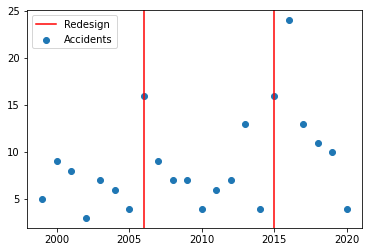

In [112]:
plt.scatter(year_counter.keys(), year_counter.values(), label="Accidents")
plt.axvline(x=2006, color='red', label="Redesign")
plt.axvline(x=2015, color='red')
plt.legend()
plt.show()